In [ ]:
# This is Oliver's second attempt at sort of baseline model to predict colexification in CLICS.
# Here, I was trying to predict p(a and b colexify) in a "randomly selected" language. 
# More specifically, I tried doing this by trying to predict the "colex.freq" column divided by the total number of languages in the CLICS.csv file. 
# This is because if a and b colexify 300 times out of 5000 languages, 300/5000 is a good estimate for the probability they colexify in a "random" language
# For the input, I converted the senses of each row to their word2vec embeddings. 
# I used neural networks, XGBoost, and random forest as models

In [ ]:
from google.colab import drive
! [ -e /content ] && pip install -Uqq fastbook
! pip install torch-lr-finder
import fastbook
fastbook.setup_book()
from fastai.tabular.all import *

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from fastbook import *
import gensim.downloader as gs
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import random as r
from torch_lr_finder import LRFinder

In [ ]:
wv = gs.load('word2vec-google-news-300') # These are the word2vec embeddings we are using

In [ ]:
NUM_LANGUAGE = 3156 # This is the number of languages used in the CLICS database
df = pd.read_csv("gdrive/MyDrive/clics-colexification-data.csv") 
df.head()

,colex.freq,Concepticon_Gloss.xo,Concepticon_Gloss.yo,vision,assoc,affec,tax,fully_covered
0,340,TREE,WOOD,1,1,1,1,1
1,326,LEG,FOOT,1,1,1,1,1
2,296,MOON,MONTH,0,1,1,1,0
3,291,GO,WALK,0,1,1,1,0
4,284,HAND,ARM,1,1,1,1,1


In [ ]:
dumb_british_spellings = {"armour":"armor", "grey":"gray", "mould":"mold", "neighbour":"neighbor", "axe":"ax", "moustache":"mustache", "plough":"plow", "mandarine":"mandarin"}
obscure_words = {"shoulderblade":"shoulder blade", "spearthrower":"spear thrower", "ridgepole":"ridge pole", "pimpleface":"pimple face", "tumpline":"backpack", "cushma":"clothing", "curassow":"tropical bird", "banisterium":"plant", "paca":"rodent", "netbag":"net bag", "muntjacs":"barking deer"}

# This converts a sense to its word2vec embeddings. More specifically, for each sense I remove punctuation and then add the vectors of each individual word. 
# I also replace some obscure words and british spellings not recognized by word2vec to similar phrases that word2vec can recognize
def stringToVec(s):  
  s = s.lower()
  for i in "(),\t\n":
    s = s.replace(i, "")
  for i in "-":
    s = s.replace(i, " ")
  for i in dumb_british_spellings:
    s = s.replace(i, dumb_british_spellings[i])
  for i in obscure_words:
    s = s.replace(i, obscure_words[i])
  arr = s.split(" ")
  vec_defined = False
  for i in arr:
    try:      # try except gives an error if we can't convert the 
      if vec_defined:
        vec += np.array(wv[i])
      else:
        vec = np.array(wv[i])
        vec_defined = True
    except:
      continue
  if not vec_defined:
    raise Exception("Word cannot be converted to vector")
  return vec #This will return the string "error" if there is not 
def toTensor(arr):
  return torch.tensor(arr, dtype = torch.float32) #Function to easily convert arrays to tensors

In [ ]:
embed_length = len(wv["test"]) # Length of embeddings in word2vec
vec_dic = {} # This will be a dictionary that easily allows us to access the embedding for all of our senses. Note this is not as simple as just calling wv[s] as some senses are phrases
error_senses = set()  # This represents the set of senses for which there was a problem converting them to embeddings. The only such sense should be "AND" as "AND" doesn't appear in word2vec
for i in range(len(df)): # Here we loop through each row of our dataframe, and if we can convert a sense s to an embedding then we set vec_dic[s] = embedding
  row = df.iloc[i]
  x = row["Concepticon_Gloss.xo"]
  y = row["Concepticon_Gloss.yo"]
  try:   
    if x not in vec_dic:
      xvec = stringToVec(x)
      vec_dic[x] = xvec
  except:
    error_senses.add(x)

  try:  
    if y not in vec_dic:
      yvec = stringToVec(y)
      vec_dic[y] = yvec
  except: 
    error_senses.add(y)

error_senses = list(error_senses)
senses = list(vec_dic.keys())

sense_indices = {senses[i]:i for i in range(len(senses))} # sense_indices is a dictionary where its keys are senses and its values are the indices for which the senses appear in our list of senses

In [ ]:
# Here we set up the dependent variables - probability distributions p(?|s) for each sense s, where p(a|b) is (roughly) proportional to how frequently they are colexified in our data set.  

# I added a small epsilon term of 0.00001, so the probabilities p(b|a) for are not actually proportional to the colexification frequency
# of a and b, but are proportional to colex.freq + epsilon. The reason for this is if a and b don't appear as colexified in our 
# data set, there is probably a very small but not actually zero probability they colexify
# Thus, this epsilon term "smooths" our probability distributions

epsilon = 0.00001
senseToProbVec = {} # This is a dictionary with keys of senses a and values of lists representing the probability distributions p(?|a). More specifically, if sense_indices[s] = i, then the ith element of senseToProbVec[a] is p(s|a)
for s in senses:
  senseToProbVec[s] = []
  for s2 in senses:
    senseToProbVec[s].append(epsilon)
for i in range(len(df)): # Here we initialize the vectors senseToProvVec[a] so that their ith element is colex.freq of a and the ith sense + epsilon. 
  row = df.iloc[i]
  x = row["Concepticon_Gloss.xo"]
  y = row["Concepticon_Gloss.yo"]
  amt = int(row["colex.freq"])
  if x in vec_dic and y in vec_dic:
    senseToProbVec[x][sense_indices[y]] += amt
    senseToProbVec[y][sense_indices[x]] += amt 
for i in senses:
  senseToProbVec[i] = np.array(senseToProbVec[i])
  senseToProbVec[i] = toTensor(senseToProbVec[i]/sum(senseToProbVec[i])) # Here we normalize the vectors to have sums 1

In [ ]:
# This is our neural network. 
# This model recieves an input of a vector representing a word or phrase s in word2vec.
# It outputs a vector predicting the probability distributions p(?|s) 
# We add a dropout layer to prevent overfitting. We output the logs of the probabilities instead of the probabilities since these are used in our KL Divergence loss function.

colex_model_2 = nn.Sequential(
    nn.Linear(embed_length, 500),
    nn.Sigmoid(),
    nn.Linear(500, 500),
    nn.Sigmoid(),
    nn.Linear(500, 500),
    nn.Sigmoid(),
    nn.Linear(500, 500),
    nn.Sigmoid(),
    nn.Linear(500, len(senses)), 
    nn.Dropout(p=0.4), 
    nn.LogSoftmax()
)

In [ ]:
# Here we set up batches of training and test data

input_output_pairs = list(zip([toTensor(vec_dic[s]) for s in senses],  [senseToProbVec[s] for s in senses]))
train, test = train_test_split(input_output_pairs, test_size = 0.2, random_state = 0)

X_train = torch.stack([i[0] for i in train])
y_train = torch.stack([i[1] for i in train])
X_test = torch.stack([i[0] for i in test])
y_test = torch.stack([i[1] for i in test])

trainDL = DataLoader(TensorDataset(X_train,y_train), batch_size = 128)
testDL = DataLoader(TensorDataset(X_test,y_test), batch_size = 128)
dls = DataLoaders(trainDL, testDL)


# Learner is a class in FastAI that does all our model training steps for us
# To compare the difference between the probability distributions p(?|a) given by our csv file and the one our model outputs, we use Kullback Leibler divergence
# This measures the "distance" between two probability distributions

learner = Learner(dls, colex_model_2, loss_func = nn.KLDivLoss(reduction = "batchmean"))

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


SuggestedLRs(valley=0.0008317637839354575)

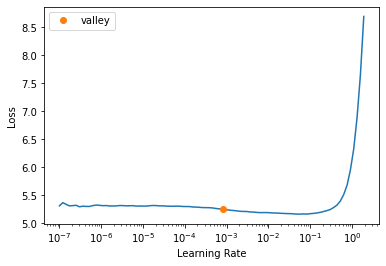

In [ ]:
# This is a function in fastai that gives you the best learning rate for a model

learner.lr_find()

In [ ]:
# For a given string a (does not have to be a sense), this returns a sorted array of pairs (p(s|a), s) given by inputting a to our model. 
# Thus, the first element of the array will be the sense that our model thinks a is most likely to colexify with

def getHighestProb(word, model):   
  dist = model(toTensor(wv[word.lower()]))
  probs_senses = [(math.exp(float(dist[i].data)), senses[i]) for i in range(len(senses))]
  probs_senses.sort(reverse = True)
  return probs_senses

for i in range(1000):
  learner.fit_one_cycle(100, 0.0008)
  print("Highest probability senses to colexify with fantasy: ", getHighestProb("fantasy", colex_model_2))
  print("Highest probability senses to colexify with maze: ", getHighestProb("maze", colex_model_2))
  print("Highest probability senses to colexify with orthogonal: ", getHighestProb("orthogonal", colex_model_2))
  print("Highest probability senses to colexify with judicial: ", getHighestProb("judicial", colex_model_2))
  print("Highest probability senses to colexify with milky: ", getHighestProb("milky",colex_model_2))

epoch,train_loss,valid_loss,time
0,4.931540,5.031215,00:01
1,4.938715,5.028995,00:01
2,4.938794,5.027171,00:01
3,4.937164,5.026413,00:02
4,4.940979,5.027102,00:01
5,4.939843,5.027516,00:01
6,4.941633,5.026755,00:01
7,4.940748,5.026893,00:01
8,4.939997,5.024982,00:01
9,4.939132,5.025717,00:01


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Highest probability senses to colexify with fantasy:  [(0.0011842833915409758, 'HOUSE'), (0.0011736818213262034, 'HEAD'), (0.0011482721809982519, 'TREE'), (0.0011145782319376698, 'CUT'), (0.0011020606010545735, 'GIVE'), (0.0011005802020446333, 'SPEAK'), (0.0010968949599166114, 'ROPE'), (0.0010764318132804869, 'BAD'), (0.0010645730362343151, 'FEAR (BE AFRAID)'), (0.0010545154966115902, 'RIVER'), (0.0010394030958362362, 'BIG'), (0.0010381707094805125, 'SAY'), (0.0010322216176518416, 'CLOUD'), (0.0010304153433281255, 'EARTH (SOIL)'), (0.001026517561203376, 'WEAVE'), (0.0010152377226172354, 'WALK'), (0.0010143135066853395, 'RUB'), (0.0010074326713289498, 'GOOD'), (0.0010059417112818765, 'MOUTH'), (0.0009984866155821322, 'LIGHTNING'), (0.0009969199974670237, 'SKIN'), (0.000984874787502887, 'WATER'), (0.00098333609070007, 'HIGH'), (0.0009805211536646821, 'CARRY'), (0.0009735185508337876, 'HOT'), (0.0009705859213282525, 'ARROW'), (0.0009702305472229923, 'DOG'), (0.0009698877900759229, 'THOU')

epoch,train_loss,valid_loss,time
0,4.887764,4.989039,00:01
1,4.891081,4.987903,00:02
2,4.887864,4.987932,00:01
3,4.887025,4.987187,00:02
4,4.885991,4.986472,00:02
5,4.885859,4.985927,00:02
6,4.890130,4.984757,00:02
7,4.889620,4.983561,00:02
8,4.888302,4.980276,00:01
9,4.887059,4.978702,00:01


Highest probability senses to colexify with fantasy:  [(0.0022895247176932215, 'HOUSE'), (0.0019446358372997128, 'HEAD'), (0.0018872536557343438, 'CORRECT (RIGHT)'), (0.0018308836110100053, 'THOU'), (0.0017654902616618445, 'GOOD'), (0.001727640575501734, 'BIG'), (0.0016858254493277173, 'BIRD'), (0.0016697545171823073, 'YOU'), (0.001645667309454285, 'SUN'), (0.0016299504464306455, 'DEER'), (0.0016228249608585522, 'HE OR SHE OR IT'), (0.0015781969058909122, 'STUPID'), (0.0015717989962045144, 'WORD'), (0.0015479131552331132, 'DOOR'), (0.001544867791525109, 'PATH OR ROAD'), (0.0015029618162649336, 'NO'), (0.0015027840930992658, 'CATTLE'), (0.0014815024971430114, 'NUMBER'), (0.001481255971687719, 'SNAKE'), (0.0014606838603585248, 'BAD'), (0.001426968947275048, 'TWO'), (0.0014198185729919891, 'LETTER'), (0.001408316096465561, 'MANY'), (0.0014010854753650885, 'BOOK'), (0.0013960904094121181, 'BEAUTIFUL'), (0.00138649407947078, 'OTHER'), (0.0013632220793388804, 'VULTURE'), (0.00136278272653259

epoch,train_loss,valid_loss,time
0,4.668246,4.858694,00:02
1,4.674366,4.858914,00:02
2,4.672737,4.858570,00:02
3,4.663976,4.859017,00:01
4,4.665527,4.858140,00:02
5,4.668880,4.859418,00:01
6,4.669083,4.859858,00:02
7,4.668357,4.862610,00:01
8,4.667313,4.862612,00:02
9,4.665148,4.863225,00:01


Highest probability senses to colexify with fantasy:  [(0.003054733782036164, 'HOUSE'), (0.002309158037492108, 'CORRECT (RIGHT)'), (0.0022496619319127046, 'THOU'), (0.0022480995181798917, 'GOOD'), (0.0022289545177887698, 'HEAD'), (0.002120450953134208, 'BIRD'), (0.0020001695731733673, 'NUMBER'), (0.0019221716956587948, 'YOU'), (0.0019084513729857075, 'MONEY'), (0.0019023258661034841, 'DEER'), (0.0018889102216601051, 'STUPID'), (0.0018824353850647806, 'BIG'), (0.0018724222855156438, 'NO'), (0.0018634040626348755, 'WORM'), (0.0018298423784270487, 'SUN'), (0.0018046871423684793, 'DOOR'), (0.001751240813472509, 'SNAKE'), (0.0017476729154775623, 'BEAUTIFUL'), (0.0017063482223130585, 'HE OR SHE OR IT'), (0.00166219503234033, 'FEAR (BE AFRAID)'), (0.0016476302675439906, 'DOG'), (0.0016401670354189149, 'BAD'), (0.0016380793958405135, 'EXPENSIVE'), (0.0016339954517743348, 'MANY'), (0.001619846929554635, 'MERRY'), (0.0015934040961538066, 'CATTLE'), (0.001573636325034414, 'WORD'), (0.001536172623

epoch,train_loss,valid_loss,time
0,4.555058,4.865326,00:02
1,4.560403,4.865185,00:02
2,4.557680,4.865256,00:02
3,4.550505,4.865156,00:02
4,4.556038,4.865144,00:02
5,4.555116,4.865205,00:02
6,4.554808,4.865673,00:02
7,4.556507,4.866212,00:02
8,4.563947,4.866157,00:01
9,4.570431,4.866023,00:01


Highest probability senses to colexify with fantasy:  [(0.0034704658144675783, 'HOUSE'), (0.0025174615089822434, 'NO'), (0.0024372595915242317, 'NUMBER'), (0.0024100848177476828, 'CORRECT (RIGHT)'), (0.002330561660023674, 'BIRD'), (0.0023100699219670406, 'GOOD'), (0.0021753957815313623, 'THOU'), (0.00217429236411391, 'HEAD'), (0.0021564051112048237, 'YOU'), (0.0021347383308469177, 'DOOR'), (0.002046671955771303, 'SUN'), (0.0019931736434704974, 'MONEY'), (0.0019506873551444993, 'BAD'), (0.0019172551349527784, 'EXPENSIVE'), (0.0019101301888145756, 'SNAKE'), (0.0019019285979395184, 'MIND'), (0.0018944088924957498, 'WORM'), (0.0018748541753105614, 'DEER'), (0.001841005498778108, 'WORD'), (0.0017586978352430627, 'ANIMAL'), (0.0017513310019175953, 'DOG'), (0.0017405439726220562, 'BIG'), (0.0017378984254441897, 'FEAR (BE AFRAID)'), (0.001720344770458598, 'THAT'), (0.0017016996727762803, 'HE OR SHE OR IT'), (0.0016919701044710352, 'MERRY'), (0.0016861904431882538, 'ONLY'), (0.00167097952345849

epoch,train_loss,valid_loss,time
0,4.474240,4.880990,00:02
1,4.494003,4.881124,00:03
2,4.492394,4.881000,00:02
3,4.485557,4.881316,00:03
4,4.490697,4.881341,00:02
5,4.491982,4.881361,00:01
6,4.493047,4.881469,00:02
7,4.499172,4.880823,00:03
8,4.503206,4.881407,00:02
9,4.506187,4.884031,00:01


Highest probability senses to colexify with fantasy:  [(0.0035313122350645754, 'HOUSE'), (0.0029914204114706256, 'BIRD'), (0.0027466764475891857, 'NO'), (0.0026626080838424307, 'CORRECT (RIGHT)'), (0.0024110469051878236, 'GOOD'), (0.0022188337402128254, 'MIND'), (0.0021968696526999325, 'YOU'), (0.0021530176209748385, 'NUMBER'), (0.0021260893066750424, 'DOOR'), (0.0021236798604363904, 'STINGY'), (0.002123445951291627, 'SUN'), (0.002113400099818567, 'DEER'), (0.0020779965004453257, 'MERRY'), (0.00206450230427551, 'HEAD'), (0.002052081837320685, 'MACHINE'), (0.002048797656852112, 'EXPENSIVE'), (0.00204121306904918, 'SNAKE'), (0.0020291339587295357, 'WORM'), (0.002009270920470165, 'THOU'), (0.00195548729668961, 'FEAR (BE AFRAID)'), (0.001952753404166328, 'BAD'), (0.0018956106951983397, 'HE OR SHE OR IT'), (0.0018645204035080021, 'MONEY'), (0.0018317507383906156, 'ANIMAL'), (0.0018166009124677097, 'WORD'), (0.001781373779389655, 'ONLY'), (0.001766616175793707, 'BIG'), (0.0017593847929924069

epoch,train_loss,valid_loss,time
0,4.439182,4.893933,00:02
1,4.434288,4.893853,00:01
2,4.434636,4.894152,00:01
3,4.431242,4.894677,00:02
4,4.427029,4.895179,00:02
5,4.434511,4.895491,00:02
6,4.438467,4.895042,00:02
7,4.442330,4.895511,00:02
8,4.449704,4.894821,00:02
9,4.454100,4.895425,00:02


Highest probability senses to colexify with fantasy:  [(0.0033362096223564686, 'HOUSE'), (0.003106962120240456, 'BIRD'), (0.0029709290666998945, 'NO'), (0.0029664119759950074, 'CORRECT (RIGHT)'), (0.00262531102461858, 'DOOR'), (0.002513128128315506, 'MERRY'), (0.00229362018204489, 'GOOD'), (0.002260670237160179, 'MIND'), (0.002206856571156449, 'YOU'), (0.002168813657331962, 'MACHINE'), (0.0021194956696138196, 'WORM'), (0.002078376036758699, 'SUN'), (0.002038359326579287, 'DEER'), (0.0020334257781821816, 'FEAR (BE AFRAID)'), (0.002026324157770713, 'BAD'), (0.0019966361736276465, 'STINGY'), (0.0019690687403506857, 'HEAD'), (0.001964123070538004, 'FAULT'), (0.0019559992782048636, 'BEARD'), (0.0019369740639430212, 'THOU'), (0.0018841829548078056, 'HONEY'), (0.0018733653625250242, 'SNAKE'), (0.001871020158296393, 'EXPENSIVE'), (0.001851685676404272, 'HE OR SHE OR IT'), (0.0018513722547823695, 'WORD'), (0.0018326619699980692, 'INSECT'), (0.0018222696386609922, 'ONLY'), (0.0018190088739578286

epoch,train_loss,valid_loss,time
0,4.382150,4.886011,00:02
1,4.365558,4.886346,00:02
2,4.371022,4.886361,00:02
3,4.379096,4.886021,00:02
4,4.379628,4.886302,00:01
5,4.380049,4.885509,00:02
6,4.380877,4.885543,00:01
7,4.384892,4.886532,00:01
8,4.388862,4.887187,00:01
9,4.387703,4.885957,00:01


Highest probability senses to colexify with fantasy:  [(0.0037263141367044443, 'CORRECT (RIGHT)'), (0.0034614388003066337, 'NO'), (0.0030686790607653723, 'BIRD'), (0.002956205601475346, 'MERRY'), (0.0029132438255237043, 'HOUSE'), (0.002822354129174662, 'MIND'), (0.0027830502918066258, 'YOU'), (0.0027555299687108477, 'BAD'), (0.002658528081402496, 'GOOD'), (0.0025684718689031596, 'MACHINE'), (0.002535297804026036, 'FAULT'), (0.002461238578518244, 'BESIDE'), (0.0024501670725492353, 'STUPID'), (0.0023934409691166465, 'ONLY'), (0.0023810616566720803, 'CLEVER'), (0.0023738312119210986, 'DOOR'), (0.002317141512916603, 'STINGY'), (0.0023045809344580284, 'WORD'), (0.002265934702716649, 'THOU'), (0.00214986712051522, 'SECOND'), (0.0021451812099655197, 'THAT'), (0.002137262233779914, 'DREAM'), (0.0020810317556943197, 'HONEY'), (0.002039539634253744, 'FEAR (BE AFRAID)'), (0.00201924926505776, 'EXPENSIVE'), (0.001983586136940553, 'CERTAIN'), (0.0019449084751499942, 'HARD'), (0.0018947521869270168,

epoch,train_loss,valid_loss,time
0,4.258242,4.844936,00:02
1,4.256826,4.845177,00:02
2,4.254523,4.845203,00:02
3,4.253964,4.845279,00:02
4,4.241236,4.845037,00:02
5,4.236946,4.845076,00:02
6,4.238044,4.845448,00:02
7,4.246382,4.846087,00:02
8,4.254380,4.844774,00:02
9,4.260895,4.841868,00:02


Highest probability senses to colexify with fantasy:  [(0.00438105716692634, 'NO'), (0.004347608196218084, 'CORRECT (RIGHT)'), (0.003940872587567758, 'MERRY'), (0.003284989263820807, 'MIND'), (0.0032216499839184745, 'MACHINE'), (0.0031489614376073883, 'GOOD'), (0.0031451468306406653, 'FAULT'), (0.003127953184878684, 'BESIDE'), (0.0031211919654661855, 'YOU'), (0.002941402219379097, 'BIRD'), (0.0028287134745702933, 'HOUSE'), (0.002764786414771552, 'ONLY'), (0.002741084415678421, 'BAD'), (0.0027278590068855737, 'WORD'), (0.002705115873403037, 'SECOND'), (0.0026355723772841567, 'MASTER'), (0.002565617356011675, 'THOU'), (0.0025609995806790582, 'STINGY'), (0.0025531813341998664, 'DREAM'), (0.00254042882781166, 'CLEVER'), (0.0024943747220212784, 'THAT'), (0.0024638958914416777, 'WHERE'), (0.002322052462040664, 'STUPID'), (0.002275882863664022, 'HARD'), (0.002253538869320124, 'CERTAIN'), (0.0022262756253987625, 'TRUE'), (0.0021914667639714616, 'FEAR (BE AFRAID)'), (0.002173985497886518, 'OTHE

epoch,train_loss,valid_loss,time
0,4.120861,4.839724,00:02
1,4.124984,4.840104,00:02
2,4.145068,4.840318,00:02
3,4.133574,4.840460,00:02
4,4.131588,4.840784,00:02
5,4.130874,4.841737,00:02
6,4.133299,4.841860,00:02
7,4.142908,4.842437,00:01
8,4.147708,4.842136,00:01
9,4.144155,4.843372,00:01


Highest probability senses to colexify with fantasy:  [(0.0041372367518973845, 'NO'), (0.00405446330321649, 'CORRECT (RIGHT)'), (0.0033181281240570524, 'MIND'), (0.0032474875042706685, 'BIRD'), (0.0032222215019072614, 'GOOD'), (0.003143713422309341, 'SECOND'), (0.0031056320045791106, 'MACHINE'), (0.002981642623745354, 'HOUSE'), (0.0028426650540498075, 'WORD'), (0.0027627779748113103, 'MASTER'), (0.0027330695565927136, 'MERRY'), (0.002713765551711797, 'FAULT'), (0.0026361266573901587, 'THAT'), (0.0025535015440833722, 'BESIDE'), (0.002517558744814579, 'FEAR (BE AFRAID)'), (0.002506717939420105, 'BAD'), (0.0025054715553870623, 'ONLY'), (0.002497124964876613, 'CLEVER'), (0.0024624394744352522, 'CUT (WITH SCISSORS)'), (0.0024286260059244004, 'WHERE'), (0.0023981488146005963, 'YOU'), (0.002395876561150845, 'STINGY'), (0.002342610278666491, 'DESPISE'), (0.0022820237429730453, 'SUN'), (0.002262582288897731, 'THOU'), (0.002201387132493401, 'TRUE'), (0.002174653194671491, 'HARD'), (0.00212533112

epoch,train_loss,valid_loss,time
0,4.058191,4.847349,00:02
1,4.036908,4.847096,00:02
2,4.017787,4.847429,00:02
3,4.019453,4.847445,00:02
4,4.031105,4.848517,00:02
5,4.040476,4.847636,00:02
6,4.038245,4.847864,00:02
7,4.046652,4.849069,00:02
8,4.051118,4.849166,00:02
9,4.045210,4.848288,00:02


Highest probability senses to colexify with fantasy:  [(0.004050355150217488, 'NO'), (0.004026728475479597, 'CORRECT (RIGHT)'), (0.0038707057352377694, 'MIND'), (0.0038081456764682605, 'BIRD'), (0.0034077855405065826, 'GOOD'), (0.0033178211901376143, 'MACHINE'), (0.0031475443011010746, 'DESPISE'), (0.0031045955610462675, 'SECOND'), (0.0030677266262088545, 'HOUSE'), (0.002919759234986925, 'MASTER'), (0.002628789703223953, 'BESIDE'), (0.002607981585600373, 'FEAR (BE AFRAID)'), (0.0025823808311251895, 'WORD'), (0.0025636069046346007, 'BAD'), (0.002513032261914032, 'THAT'), (0.0025083321088583198, 'WHERE'), (0.0024309490247600304, 'CUT (WITH SCISSORS)'), (0.002422722459032512, 'STINGY'), (0.0024019025160860476, 'SUN'), (0.002378421095752187, 'LOCUST'), (0.002330207182795034, 'THOU'), (0.0022620666414436266, 'ONLY'), (0.0022417506022893194, 'FAULT'), (0.0022338862677575054, 'LETTER'), (0.0022326126517861807, 'EXPENSIVE'), (0.0022222993511121403, 'BE ALIVE'), (0.0021818636668827296, 'HARD'),

epoch,train_loss,valid_loss,time
0,3.925560,4.857812,00:02
1,3.951443,4.857215,00:01
2,3.944442,4.857696,00:02
3,3.940169,4.856596,00:02
4,3.938340,4.857604,00:02
5,3.941940,4.856852,00:02
6,3.931083,4.855626,00:02
7,3.947338,4.857200,00:02
8,3.952629,4.859343,00:02
9,3.945684,4.856473,00:02


Highest probability senses to colexify with fantasy:  [(0.004116177751326775, 'MIND'), (0.003808548819916284, 'BIRD'), (0.003784673800386982, 'CORRECT (RIGHT)'), (0.0037388726704732835, 'NO'), (0.0036801065414307763, 'GOOD'), (0.003431713802235126, 'MACHINE'), (0.0033050060011577064, 'SECOND'), (0.003270084376247845, 'DESPISE'), (0.0031756088012443026, 'HOUSE'), (0.0030098176658123364, 'MASTER'), (0.0029522274891290398, 'BESIDE'), (0.0026639377188282494, 'WHERE'), (0.0026142866969449327, 'LOCUST'), (0.002611067494540304, 'BE ALIVE'), (0.0025967823682356847, 'STINGY'), (0.002556129267941708, 'WORD'), (0.0025363812315379046, 'CUT (WITH SCISSORS)'), (0.0024770093969299057, 'BAD'), (0.002411411380264875, 'EXPENSIVE'), (0.002353224945111266, 'FEAR (BE AFRAID)'), (0.0023352438119705874, 'BOOK'), (0.002322914055265432, 'SUN'), (0.00230428754421208, 'SPIRIT'), (0.0022997409305799943, 'LETTER'), (0.0022611974267195472, 'END (OF SPACE)'), (0.002173709769913609, 'ONLY'), (0.002166081032314498, 'T

epoch,train_loss,valid_loss,time
0,3.835305,4.866203,00:02
1,3.837172,4.866498,00:02
2,3.830852,4.866721,00:02
3,3.835370,4.867542,00:02
4,3.850565,4.868105,00:02
5,3.849434,4.866574,00:02
6,3.860878,4.867713,00:02
7,3.867220,4.868375,00:02
8,3.863540,4.869208,00:02
9,3.874700,4.872396,00:02


Highest probability senses to colexify with fantasy:  [(0.004505571450344745, 'MIND'), (0.00395255566223081, 'GOOD'), (0.003825340676420271, 'CORRECT (RIGHT)'), (0.003668200144437449, 'NO'), (0.003547307987463919, 'BIRD'), (0.00341919066941487, 'STINGY'), (0.0034097441784797385, 'MACHINE'), (0.0033842806996754924, 'MASTER'), (0.003255975190088514, 'BESIDE'), (0.0032326895716111082, 'DESPISE'), (0.0032145620733915565, 'HOUSE'), (0.0031505775111586075, 'SECOND'), (0.003045595593483937, 'WHERE'), (0.0028947424859390248, 'BE ALIVE'), (0.0028171076869382, 'WORD'), (0.0027895724687018457, 'LOCUST'), (0.0026985543845129633, 'BAD'), (0.0025777808213719882, 'SPIRIT'), (0.0024999163854951675, 'BOOK'), (0.0024828202756500984, 'FEAR (BE AFRAID)'), (0.002442290024479227, 'HATE'), (0.0024036004748263194, 'CUT (WITH SCISSORS)'), (0.002329960525130212, 'POINT (WITH FINGER)'), (0.0023210661199456898, 'EXPENSIVE'), (0.0023065059290766823, 'GOOD-LOOKING'), (0.002222695704868695, 'ONLY'), (0.0022130486225

epoch,train_loss,valid_loss,time
0,3.814728,4.879392,00:02
1,3.796180,4.878568,00:02
2,3.802109,4.879169,00:02
3,3.794887,4.879496,00:02
4,3.793097,4.880252,00:02
5,3.787081,4.882103,00:02
6,3.793437,4.884781,00:02
7,3.789026,4.887609,00:02
8,3.800123,4.889320,00:02
9,3.801798,4.886898,00:02


Highest probability senses to colexify with fantasy:  [(0.005137502260680455, 'MIND'), (0.004352939332051177, 'STINGY'), (0.00424767771279912, 'GOOD'), (0.004077774352089555, 'CORRECT (RIGHT)'), (0.003862709221700684, 'DESPISE'), (0.003839025516007106, 'MASTER'), (0.0038156198399432796, 'WHERE'), (0.003695200714168658, 'BIRD'), (0.0036669514752408765, 'BE ALIVE'), (0.0036188837369905223, 'BESIDE'), (0.0032507890833208806, 'MACHINE'), (0.003191473707934757, 'SECOND'), (0.00316661481302367, 'HOUSE'), (0.0030472516121328864, 'LOCUST'), (0.002966925482286392, 'WORD'), (0.0029563860394526136, 'NO'), (0.0028695514565534796, 'BOOK'), (0.002776587055119122, 'SPIRIT'), (0.0026213469209518648, 'BAD'), (0.0025789414300744495, 'GOOD-LOOKING'), (0.0025139299542748864, 'LETTER'), (0.002488085923534027, 'HE'), (0.0024761874667633063, 'CUT (WITH SCISSORS)'), (0.002465008751314823, 'END (OF SPACE)'), (0.002439518745756143, 'ONE'), (0.0023786672124289834, 'GAP (DISTANCE)'), (0.002378020785240592, 'HATE'

epoch,train_loss,valid_loss,time
0,3.733599,4.895761,00:02
1,3.712785,4.894657,00:02
2,3.705093,4.895857,00:02
3,3.710922,4.896029,00:02
4,3.710177,4.897585,00:02
5,3.718436,4.898912,00:02
6,3.720773,4.899343,00:02
7,3.717127,4.900216,00:02
8,3.726507,4.897850,00:02
9,3.725869,4.899975,00:02


Highest probability senses to colexify with fantasy:  [(0.005469087822922274, 'MIND'), (0.004401760376855465, 'GOOD'), (0.004214983782022205, 'LOCUST'), (0.004093421994422873, 'STINGY'), (0.003955413938930186, 'CORRECT (RIGHT)'), (0.003916272631562129, 'WHERE'), (0.0037920151027977006, 'MASTER'), (0.0037818649671884446, 'DESPISE'), (0.0036227961012151567, 'BE ALIVE'), (0.0034736942669553214, 'MACHINE'), (0.0032386204027040825, 'SECOND'), (0.0032080648817538492, 'BESIDE'), (0.0031925589452561054, 'BIRD'), (0.00318505203805929, 'WORD'), (0.003030624924743927, 'SPIRIT'), (0.0030177733897432607, 'HOUSE'), (0.002922589657393247, 'GOOD-LOOKING'), (0.0028959380905752177, 'NO'), (0.002894917791986243, 'BOOK'), (0.0026190105457598303, 'BAD'), (0.0025996988271880317, 'HATE'), (0.0025344094004298417, 'END (OF SPACE)'), (0.0025282704136243973, 'HE'), (0.0025113671668350185, 'END (OF TIME)'), (0.0024317802894667224, 'CUT (WITH SCISSORS)'), (0.0024091736601569496, 'LEARN'), (0.002390321598473038, 'T

epoch,train_loss,valid_loss,time
0,3.643248,4.909824,00:02
1,3.666889,4.909930,00:02
2,3.652367,4.909931,00:02
3,3.646932,4.910030,00:02
4,3.652189,4.911184,00:02
5,3.667552,4.911616,00:02
6,3.675657,4.913013,00:02
7,3.676650,4.915975,00:02
8,3.677294,4.914871,00:02
9,3.697813,4.915931,00:02


Highest probability senses to colexify with fantasy:  [(0.005365569886362075, 'MIND'), (0.004966673029723044, 'STINGY'), (0.004321487129370832, 'BE ALIVE'), (0.004312133692503579, 'GOOD'), (0.004165857869146588, 'WHERE'), (0.0037137163264714806, 'CORRECT (RIGHT)'), (0.0036836810726055768, 'MASTER'), (0.003648648142387789, 'LOCUST'), (0.0036472530807256814, 'BIRD'), (0.0034981019966013713, 'DESPISE'), (0.0034040729085960775, 'MACHINE'), (0.0033201951296649374, 'GOOD-LOOKING'), (0.003193757244373731, 'BESIDE'), (0.0031287020197026984, 'BOOK'), (0.003074308991132883, 'HOUSE'), (0.003069969927695384, 'SPIRIT'), (0.003036341402097072, 'SECOND'), (0.002966864649076486, 'WORD'), (0.002878532007388903, 'HATE'), (0.0027591193581629134, 'END (OF SPACE)'), (0.0026264166372439207, 'END (OF TIME)'), (0.0026253398172309803, 'NO'), (0.002559698133848749, 'BAD'), (0.002532603335890886, 'LETTER'), (0.002519165480231113, 'THREE'), (0.002506054637770033, 'HE'), (0.002456902392919923, 'CUT (WITH SCISSORS)

epoch,train_loss,valid_loss,time
0,3.569652,4.921461,00:02
1,3.592316,4.922044,00:02
2,3.594690,4.921587,00:02
3,3.591089,4.922382,00:02
4,3.605179,4.923575,00:02
5,3.610116,4.924355,00:02
6,3.608514,4.927483,00:02
7,3.610831,4.928264,00:02
8,3.626154,4.930034,00:02
9,3.626883,4.929596,00:02


Highest probability senses to colexify with fantasy:  [(0.005611524476345892, 'MIND'), (0.004347355285235848, 'BE ALIVE'), (0.0042922101870996095, 'WHERE'), (0.004093822152601394, 'LOCUST'), (0.00393810932054857, 'GOOD'), (0.0038763096305491755, 'BIRD'), (0.0038596915543528446, 'STINGY'), (0.003822117089258033, 'MASTER'), (0.0036562154577251416, 'BESIDE'), (0.0033890333022136444, 'CORRECT (RIGHT)'), (0.0033344045202782484, 'HOUSE'), (0.0033308591878630366, 'SPIRIT'), (0.0033250923855603245, 'BOOK'), (0.003259380202629477, 'DESPISE'), (0.0032503132383632444, 'MACHINE'), (0.0030290256050520955, 'SECOND'), (0.0030280436049331953, 'GHOST'), (0.003012037292082461, 'HATE'), (0.002983147223203148, 'GOOD-LOOKING'), (0.002957607104494604, 'LETTER'), (0.0028436520208478637, 'WORD'), (0.0027685594762367157, 'END (OF SPACE)'), (0.0027396940662474598, 'END (OF TIME)'), (0.0026387009990104554, 'THREE'), (0.0025683640937956206, 'SELF'), (0.002544862675791252, 'BILL'), (0.002484920219615411, 'CUT (WIT

epoch,train_loss,valid_loss,time
0,3.562705,4.935292,00:02
1,3.552778,4.935653,00:02
2,3.529371,4.935672,00:02
3,3.523539,4.935788,00:02
4,3.518055,4.935345,00:02
5,3.520753,4.938452,00:02
6,3.525811,4.942483,00:02
7,3.540804,4.942746,00:02
8,3.550505,4.943710,00:02
9,3.556033,4.945497,00:02


epoch,train_loss,valid_loss,time
0,3.562705,4.935292,00:02
1,3.552778,4.935653,00:02
2,3.529371,4.935672,00:02
3,3.523539,4.935788,00:02
4,3.518055,4.935345,00:02
5,3.520753,4.938452,00:02
6,3.525811,4.942483,00:02
7,3.540804,4.942746,00:02
8,3.550505,4.943710,00:02
9,3.556033,4.945497,00:02


Highest probability senses to colexify with fantasy:  [(0.006411958043977421, 'LOCUST'), (0.006259328874291447, 'MIND'), (0.0057661302577779825, 'STINGY'), (0.004410214550952066, 'WHERE'), (0.004395570811184445, 'BE ALIVE'), (0.004056592446019394, 'MASTER'), (0.0038377241871128155, 'GOOD'), (0.0038176217371692117, 'DESPISE'), (0.003816804472289281, 'SPIRIT'), (0.0035136574533935184, 'HOUSE'), (0.003343356906659462, 'HATE'), (0.0033155074428754872, 'SECOND'), (0.0032827500682639328, 'GOOD-LOOKING'), (0.003133582782965163, 'BESIDE'), (0.0031235622391078337, 'CORRECT (RIGHT)'), (0.003100550821369128, 'THREE'), (0.003040967877617575, 'BOOK'), (0.003014239870264325, 'BIRD'), (0.002875734654407543, 'MACHINE'), (0.002813441517841926, 'SELF'), (0.0027935272097913267, 'END (OF TIME)'), (0.0027362330198444887, 'GHOST'), (0.002714118843327701, 'END (OF SPACE)'), (0.002699285369430007, 'NOT'), (0.0026843191992228896, 'WET'), (0.0026386582195139226, 'SWINDLE'), (0.002587625651251714, 'LETTER'), (0.

epoch,train_loss,valid_loss,time
0,3.444803,4.947619,00:02
1,3.461388,4.946472,00:02
2,3.459519,4.947242,00:02
3,3.463661,4.949118,00:02
4,3.478506,4.948986,00:02
5,3.474671,4.949971,00:02
6,3.501311,4.951809,00:02
7,3.502902,4.949418,00:02
8,3.508786,4.951825,00:02
9,3.513759,4.954580,00:02


Highest probability senses to colexify with fantasy:  [(0.0059932684857858, 'MIND'), (0.0056822052219446095, 'STINGY'), (0.004673189840511627, 'LOCUST'), (0.004621918059712484, 'WHERE'), (0.004441185749192179, 'BE ALIVE'), (0.004131389597836696, 'MASTER'), (0.0039210486780259885, 'SPIRIT'), (0.0037437411898613216, 'GOOD'), (0.0034900131018406767, 'BESIDE'), (0.003488716955769155, 'BOOK'), (0.0034241865918495347, 'HOUSE'), (0.0031047406423154885, 'DESPISE'), (0.003042490807640311, 'SELF'), (0.003037036445030034, 'CORRECT (RIGHT)'), (0.0030011000366781345, 'WET'), (0.00290828464369305, 'SECOND'), (0.002900960598377336, 'END (OF SPACE)'), (0.0028806136076668563, 'THREE'), (0.002879351560875498, 'MACHINE'), (0.0028517368718002987, 'END (OF TIME)'), (0.0028456242687807157, 'GHOST'), (0.0028044313463441817, 'GOOD-LOOKING'), (0.0027872841820737533, 'BILL'), (0.0027410138358383413, 'SWINDLE'), (0.002689649213753901, 'CUSTOM'), (0.0026684051700495725, 'OWE'), (0.00266620737752889, 'NO'), (0.002

epoch,train_loss,valid_loss,time
0,3.434701,4.956692,00:02
1,3.425694,4.956464,00:02
2,3.417306,4.955564,00:02
3,3.436964,4.957112,00:02
4,3.433582,4.956673,00:02
5,3.430278,4.959814,00:02
6,3.422612,4.961309,00:02
7,3.439376,4.964567,00:02
8,3.441623,4.963165,00:02
9,3.448875,4.964685,00:02


Highest probability senses to colexify with fantasy:  [(0.007030395058202503, 'STINGY'), (0.006620651925567589, 'MIND'), (0.006355416498176, 'LOCUST'), (0.004186081039853096, 'MASTER'), (0.004175465402340337, 'BE ALIVE'), (0.004093847529804828, 'WHERE'), (0.004005618808591476, 'SPIRIT'), (0.0037678268862799814, 'SELF'), (0.003549886752452733, 'BOOK'), (0.0032209249779653597, 'SECOND'), (0.003191507188001941, 'THREE'), (0.003127641471831139, 'DESPISE'), (0.003066609245934443, 'THOUGHT'), (0.003055108153892751, 'HOUSE'), (0.00295878493692862, 'SWINDLE'), (0.0029548836654306717, 'NO'), (0.002952369673461245, 'WET'), (0.0029289374180107896, 'GOOD'), (0.0028890776782290913, 'NOT'), (0.0028647199254416577, 'OWE'), (0.0028006855186136284, 'BILL'), (0.002791915885014385, 'HATE'), (0.0027770451899497006, 'GOOD-LOOKING'), (0.0027415471507519656, 'SOUL'), (0.0027247662901462594, 'HE'), (0.0027144566486469093, 'BESIDE'), (0.0026889118631470196, 'END (OF SPACE)'), (0.0026575660825997305, 'CLEVER'),

epoch,train_loss,valid_loss,time
0,3.343864,4.964215,00:02
1,3.371416,4.964033,00:02
2,3.368994,4.964153,00:02
3,3.385558,4.964577,00:02
4,3.381700,4.964070,00:02
5,3.370088,4.967834,00:02
6,3.374720,4.969697,00:02
7,3.367726,4.972254,00:02
8,3.375449,4.974750,00:02
9,3.395401,4.974890,00:02
